In [1]:
import pandas as pd
import os

In [2]:
os.listdir("demand_data")

['archive1dayahead.csv',
 'archive2dayahead.csv',
 'demanddata.csv',
 'demanddata2024.csv',
 'demanddataupdate.csv',
 'demanddata_2020.csv',
 'demanddata_2021.csv',
 'demanddata_2022.csv',
 'ng-demand-1da.csv',
 'ng-demand-2da.csv']

# Get historical demand data from https://www.neso.energy/ and preprocess it (https://www.neso.energy/data-portal/historic-demand-data/historic_demand_data_2022#) #

In [3]:
import numpy as np


def extract_historic_demand_data(file_path:str = "demand_data"):
    df = None
    for file in os.listdir(file_path):
        if "demanddata" in file:
            if df is None:
                df = pd.read_csv(f"{file_path}/{file}")
                df = df[['SETTLEMENT_DATE', 'SETTLEMENT_PERIOD', 'ND', 'TSD',
            'ENGLAND_WALES_DEMAND', 'EMBEDDED_WIND_GENERATION',
            'EMBEDDED_WIND_CAPACITY', 'EMBEDDED_SOLAR_GENERATION',
            'EMBEDDED_SOLAR_CAPACITY']]
                
                df = df.replace({"SETTLEMENT_DATE": {"JAN": "01", "FEB": "02", "MAR":"03", "APR":"04", "MAY":"05", "JUN":"06", "JUL":"07", "AUG":"08", "SEP":"09", "OCT":"10", "NOV":"11", "DEC":"12"}}, regex = True)
                df["SETTLEMENT_DATE"] = pd.to_datetime(df["SETTLEMENT_DATE"]).dt.strftime('%d-%m-%Y')

            else:
                df_next = pd.read_csv(f"{file_path}/{file}")
                df_next = df_next[['SETTLEMENT_DATE', 'SETTLEMENT_PERIOD', 'ND', 'TSD',
            'ENGLAND_WALES_DEMAND', 'EMBEDDED_WIND_GENERATION',
            'EMBEDDED_WIND_CAPACITY', 'EMBEDDED_SOLAR_GENERATION',
            'EMBEDDED_SOLAR_CAPACITY']]
                df_next = df_next.replace({"SETTLEMENT_DATE": {"JAN": "01", "FEB": "02", "MAR":"03", "APR":"04", "MAY":"05", "JUN":"06", "JUL":"07", "AUG":"08", "SEP":"09", "OCT":"10", "NOV":"11", "DEC":"12",}}, regex = True)
                df_next['SETTLEMENT_DATE'] = df_next['SETTLEMENT_DATE'].apply(lambda x: '-'.join([f'{int(part):02d}' for part in x.split('-')]))
                try:
                    df_next["SETTLEMENT_DATE"] = pd.to_datetime(df_next["SETTLEMENT_DATE"]).dt.strftime('%d-%m-%Y')
                except Exception as e:
                    pass

                df = pd.concat([df, df_next])

    # datetime conversion
    df["SETTLEMENT_DATE"] = pd.to_datetime(df["SETTLEMENT_DATE"], format =  "%d-%m-%Y")
    df = df.sort_values(["SETTLEMENT_DATE", "SETTLEMENT_PERIOD"])
    # format date to datetime
    df["SETTLEMENT_DATE"] = df["SETTLEMENT_DATE"] + pd.to_timedelta(0.5*(df["SETTLEMENT_PERIOD"] - 1), "h")
    df = df.drop(["SETTLEMENT_PERIOD"], axis = 1)
    # remove empty demand forecasts (we can get them through the Rebase API)
    df[df["ND"] + df["TSD"] + df["ENGLAND_WALES_DEMAND"] > 0]
    # some demand values drop randomly to 0. Replace them with the previous value
    df.loc[df["ENGLAND_WALES_DEMAND"] == 0, "ENGLAND_WALES_DEMAND"] = np.nan
    df = df.bfill()
    df = df.dropna(axis = 0)
    # convert MW to MWh
    df[[ 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
        'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
        'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY']] = 0.5 * df[[ 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
        'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
        'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY']]
    
    return df
    
df = extract_historic_demand_data()

In [4]:
df.head()

,SETTLEMENT_DATE,ND,TSD,ENGLAND_WALES_DEMAND,EMBEDDED_WIND_GENERATION,EMBEDDED_WIND_CAPACITY,EMBEDDED_SOLAR_GENERATION,EMBEDDED_SOLAR_CAPACITY
0,2020-01-01 00:00:00,13170.0,13576.5,11910.5,622.0,3232.5,0.0,6540.0
1,2020-01-01 00:30:00,13460.5,13842.0,12196.5,594.0,3232.5,0.0,6540.0
2,2020-01-01 01:00:00,13284.5,13620.0,12042.5,578.0,3232.5,0.0,6540.0
3,2020-01-01 01:30:00,12877.0,13217.5,11675.0,562.5,3232.5,0.0,6540.0
4,2020-01-01 02:00:00,12537.5,12912.0,11394.0,553.0,3232.5,0.0,6540.0


In [5]:
import plotly.express as px

px.line(df, x = "SETTLEMENT_DATE", y = ["ENGLAND_WALES_DEMAND", "EMBEDDED_SOLAR_GENERATION", "EMBEDDED_WIND_GENERATION"])

# Get energy data #

In [6]:
import pandas as pd
import os
from Preprocessing import *
preprocesser = Preprocessing()
extractor = FileExtractor()
df_energy = extractor.combine_files("csv_files", "Energy_data", ".csv")
#df_energy = preprocesser.preprocess_energy_data(df_energy, trading = True)[["dtm", "SS_Price", "DA_Price", "MIP"]]
df_energy = preprocesser.preprocess_energy_data(df_energy, trading = True)[["dtm", "SS_Price", "DA_Price", "Wind_MWh_credit", "Solar_MWh_credit"]]
df_energy

,dtm,SS_Price,DA_Price,Wind_MWh_credit,Solar_MWh_credit
0,2020-09-20 00:00:00+00:00,2.50000,32.17,498.142,0.0
0,2020-09-20 00:00:00+00:00,2.50000,32.17,498.142,0.0
1,2020-09-20 00:30:00+00:00,15.00000,32.17,478.788,0.0
1,2020-09-20 00:30:00+00:00,15.00000,32.17,478.788,0.0
2,2020-09-20 01:00:00+00:00,47.95000,32.00,470.522,0.0
...,...,...,...,...,...
5851,2024-05-19 21:30:00+00:00,56.20000,76.81,113.759,0.0
5852,2024-05-19 22:00:00+00:00,102.00023,71.11,98.545,0.0
5853,2024-05-19 22:30:00+00:00,99.00000,71.11,85.653,0.0
5854,2024-05-19 23:00:00+00:00,106.44988,66.51,81.582,0.0


# Get margin and surplus data #

In [7]:
from datetime import date
import csv
import requests
import pandas as pd

def preprocess_margin_or_surplus_data(data):
    df = pd.concat([pd.DataFrame(x) for x in data])
    df.columns = df.iloc[0]
    df = df[df["ForecastDate"] != "ForecastDate"]
    df["PublishTime"] = pd.to_datetime(df["PublishTime"])
    df["ForecastDate"] = pd.to_datetime(df["ForecastDate"])

    df.drop(["PublishTime"], axis = 1, inplace = True)

    return df

def preprocess_recent_margin_or_surplus_data(df):
    df = pd.DataFrame(df)
    df.columns = df.iloc[0]
    df = df[df["PublishTime"] != "PublishTime"]
    df["PublishTime"] = pd.to_datetime(df["PublishTime"])
    df["ForecastDate"] = pd.to_datetime(df["ForecastDate"])


    expanded_df = pd.DataFrame()

    for week_start in df['ForecastDate']:
        # Generate a range of dates for the week (7 days starting from week_start)
        week_dates = pd.date_range(start=week_start, periods=7, freq='D')
        
        # Create a DataFrame for the current week and append to the expanded DataFrame
        expanded_df = pd.concat([expanded_df, pd.DataFrame({'date': week_dates})])

    # Reset index for a clean DataFrame
    expanded_df.reset_index(drop=True, inplace=True)
    df = expanded_df.merge(df, left_on = "date", right_on = "ForecastDate", how = "left").ffill()
    df.drop(["ForecastDate", "PublishTime"], axis = 1, inplace = True)

    return df


def extract_margin_or_surplus_data(name:str, start_year:int = 2020, start_date = None):

    all_api_data = list()
    name = name.lower()

    for year in range(start_year, 2025, 1):
        start_date = date(year, 5, 1) 

        url = f"https://data.elexon.co.uk/bmrs/api/v1/forecast/{name}/daily/history?publishTime={start_date}&range=52W&format=csv"

        with requests.Session() as s:
            download = s.get(url)

            decoded_content = download.content.decode('utf-8')
            cr = csv.reader(decoded_content.splitlines(), delimiter=',')
            my_list = list(cr)
            all_api_data.append(my_list)

    df = preprocess_margin_or_surplus_data(all_api_data)
    
    return df


def extract_recent_margin_or_surplus_data(name:str, start_date = None, previous_dates:bool = False):
    name = name.lower()

    start_date = str((datetime.now() - pd.Timedelta("2d")).date())

    url = f"https://data.elexon.co.uk/bmrs/api/v1/forecast/{name}/daily?publishTime={start_date}&format=csv"
    if previous_dates:
        url = f"https://data.elexon.co.uk/bmrs/api/v1/forecast/{name}/daily/history?publishTime={start_date}&range=52W&format=csv"

    with requests.Session() as s:
        download = s.get(url)

        decoded_content = download.content.decode('utf-8')
        cr = csv.reader(decoded_content.splitlines(), delimiter=',')
        my_list = list(cr)

    df = preprocess_recent_margin_or_surplus_data(my_list)
    
    return df


def combine_margin_and_surplus_data(start_year:int = 2020):
    df_margin = extract_margin_or_surplus_data("margin", start_year = start_year)
    df_surplus = extract_margin_or_surplus_data("surplus", start_year = start_year)

    return df_margin.merge(df_surplus, on = ["ForecastDate"])


def combine_recent_margin_and_surplus_data(previous_dates:bool = False):

    start_date = str((datetime.now() - pd.Timedelta("2d")).date())

    df_margin = extract_recent_margin_or_surplus_data("margin", start_date = start_date, previous_dates = previous_dates)
    df_surplus = extract_recent_margin_or_surplus_data("surplus", start_date = start_date, previous_dates = previous_dates)

    df = df_margin.merge(df_surplus, on = ["date"])

    return df

# Merge energy data with historic demand data #

In [8]:
def merge_demand_and_energy_data(demand_data, energy_data):
    demand_data["SETTLEMENT_DATE"] = demand_data["SETTLEMENT_DATE"].dt.tz_localize("UTC")
    demand_and_energy = demand_data.merge(energy_data, left_on = "SETTLEMENT_DATE", right_on = "dtm")
    # we can't get those features from deployment, so they will be removed
    demand_and_energy = demand_and_energy.drop(["EMBEDDED_WIND_GENERATION", "EMBEDDED_SOLAR_GENERATION", "ENGLAND_WALES_DEMAND", "EMBEDDED_WIND_CAPACITY", "EMBEDDED_SOLAR_CAPACITY"], axis = 1)
    # demand_and_energy["DA_SS_price_diff"] = demand_and_energy["DA_Price"] - demand_and_energy["SS_Price"]
    # demand_and_energy.drop(["DA_Price", "SS_Price"], axis = 1, inplace = True)
    #demand_and_energy.drop(["DA_Price", "SS_Price"], axis = 1, inplace = True)
    return demand_and_energy

demand_and_energy = merge_demand_and_energy_data(df, df_energy)
demand_and_energy.head()

,SETTLEMENT_DATE,ND,TSD,dtm,SS_Price,DA_Price,Wind_MWh_credit,Solar_MWh_credit
0,2020-09-20 00:00:00+00:00,10030.0,10462.0,2020-09-20 00:00:00+00:00,2.50,32.17,498.142,0.0
1,2020-09-20 00:00:00+00:00,10030.0,10462.0,2020-09-20 00:00:00+00:00,2.50,32.17,498.142,0.0
2,2020-09-20 00:30:00+00:00,9694.5,10239.0,2020-09-20 00:30:00+00:00,15.00,32.17,478.788,0.0
3,2020-09-20 00:30:00+00:00,9694.5,10239.0,2020-09-20 00:30:00+00:00,15.00,32.17,478.788,0.0
4,2020-09-20 01:00:00+00:00,9468.0,9904.0,2020-09-20 01:00:00+00:00,47.95,32.00,470.522,0.0


In [9]:
def get_historic_demand_weather_data(geo_data_dict:dict = {"dwd_icon_eu_demand":"nc_files", "ncep_gfs_demand":"nc_files"},
                                     energy_data_dict:dict = {"Energy_data":"csv_files"}, 
                                     file_name:str = "preprocessed_demand_with_energy.parquet"):
    # get the weather data
    try:
        weather = pd.read_parquet(f"{file_name}")
    except:
        weather = preprocesser.perform_preprocessing_pipeline(geo_data_dict = geo_data_dict,
            deployment = False, merge_with_outage_data = False, energy_data_dict = energy_data_dict,
                                                #non_numerical_columns = ["unavailabilityType", "affectedUnit"],
                                                fft = False)
        weather.to_parquet("preprocessed_demand_with_energy.parquet")
        
    return weather


def get_interquartile_range(data):
    # calculate IQR for column Height
    Q1 = df['Height'].quantile(0.25)
    Q3 = df['Height'].quantile(0.75)
    IQR = Q3 - Q1

    # identify outliers
    threshold = 1.5
    outliers = df[(df['Height'] < Q1 - threshold * IQR) | (df['Height'] > Q3 + threshold * IQR)]



def combine_historic_demand_data(weather_data, demand_energy_data):
    demand_with_weather = weather_data.merge(demand_energy_data, left_on = "dtm", right_on = "SETTLEMENT_DATE")
    demand_with_weather["dayofweek_sin"] = demand_with_weather["dtm"].apply(preprocesser.get_cycles, args = (0, "dayofweek"))
    demand_with_weather["dayofweek_cos"] = demand_with_weather["dtm"].apply(preprocesser.get_cycles, args = (1, "dayofweek"))
    demand_with_weather["hour"] = demand_with_weather["dtm"].dt.hour
    demand_with_weather["month"] = demand_with_weather["dtm"].dt.month
    demand_with_weather["dayofweek"] = demand_with_weather["dtm"].dt.dayofweek
    demand_with_weather.set_index("dtm", inplace = True)
    try:
        demand_with_weather.drop(["SETTLEMENT_DATE", "Solar_MWh_credit", "Wind_MWh_credit"], axis = 1, inplace = True)
    except:
        demand_with_weather.drop(["SETTLEMENT_DATE", "Solar_MWh_credit_x", "Wind_MWh_credit_x"], axis = 1, inplace = True)

    # remove outliers with mean with filtering through IQR
    for col in ["ND", "TSD", "DA_Price", "SS_Price"]:
        Q1 = demand_with_weather[col].quantile(0.25)
        Q3 = demand_with_weather[col].quantile(0.75)
        IQR = Q3 - Q1
        threshold = 1.5
        outliers = (demand_with_weather[col] < Q1 - threshold * IQR) | (demand_with_weather[col] > Q3 + threshold * IQR)
        demand_with_weather.loc[outliers, col] = np.nan
        demand_with_weather[col] = demand_with_weather[col].fillna(demand_with_weather[col].mean())
        # demand_with_weather[col] = demand_with_weather[col].bfill()
        # demand_with_weather[col] = demand_with_weather[col].ffill()
    
    demand_with_weather["ND_diff"] = demand_with_weather["ND"].diff()
    demand_with_weather["TSD_diff"] = demand_with_weather["TSD"].diff()
    nd_avg = demand_with_weather.groupby(["month", "hour", "dayofweek"]).mean()["ND"]
    demand_with_weather["ND_avg"] = demand_with_weather.merge(nd_avg, left_on = ["month", "hour", "dayofweek"], right_index = True)["ND_y"]
    tsd_avg = demand_with_weather.groupby(["month", "hour", "dayofweek"]).mean()["TSD"]
    demand_with_weather["TSD_avg"] = demand_with_weather.merge(tsd_avg, left_on = ["month", "hour", "dayofweek"], right_index = True)["TSD_y"]
    demand_with_weather = demand_with_weather.reindex(sorted(demand_with_weather.columns), axis=1)
    return demand_with_weather.fillna(0)

## Perform everything above in one cell (for training) ##

In [10]:
import pandas as pd
import os
from Preprocessing import *
preprocesser = Preprocessing()
extractor = FileExtractor()
demand_data = extract_historic_demand_data()
energy_data = extractor.combine_files("csv_files", "Energy_data", ".csv")
# energy_data = preprocesser.preprocess_energy_data(energy_data, trading = True)[["dtm", "SS_Price", "DA_Price", "MIP"]]
# energy_data = preprocesser.preprocess_energy_data(energy_data, trading = True)[["dtm", "SS_Price", "DA_Price", "Wind_MWh_credit", "Solar_MWh_credit"]]
energy_data = preprocesser.preprocess_energy_data(energy_data, trading = True)[["dtm", "SS_Price", "DA_Price"]]
demand_energy = merge_demand_and_energy_data(demand_data, energy_data)
weather_data = get_historic_demand_weather_data(geo_data_dict = {"dwd_icon_eu_demand":"nc_files", "ncep_gfs_demand":"nc_files"},
                                     energy_data_dict = {"Energy_data":"csv_files"}, 
                                     file_name = "preprocessed_demand_with_energy.parquet")
historic_demand_with_weather = combine_historic_demand_data(weather_data = weather_data, demand_energy_data = demand_energy)
# add margin and surplus data
historic_margin_surplus_data = combine_margin_and_surplus_data()
historic_demand_with_weather["date_date"] = historic_demand_with_weather.index
historic_demand_with_weather["date_date"] = pd.to_datetime(historic_demand_with_weather["date_date"].dt.date)
historic_demand_with_weather.reset_index(inplace = True)
historic_demand_with_weather = historic_demand_with_weather.merge(historic_margin_surplus_data, left_on = "date_date", right_on = "ForecastDate")
historic_demand_with_weather.set_index("dtm", inplace = True)
historic_demand_with_weather.drop(["date_date", "ForecastDate"], axis = 1, inplace = True)
historic_demand_data_with_weather = historic_demand_with_weather.reindex(sorted(historic_demand_with_weather.columns), axis=1)


historic_demand_with_weather = historic_demand_with_weather.drop(['wind_dir_cos', 'wind_dir_sin', 'wind_speed',
       'wind_speed_diff', 'wind_speed_max_1h', 'wind_speed_max_3h',
       'wind_speed_max_6h', 'wind_speed_mean_1h', 'wind_speed_mean_3h',
       'wind_speed_mean_6h', 'wind_speed_min_1h', 'wind_speed_min_3h',
       'wind_speed_min_6h', 'wind_speed_next_forecast', 'wind_speed_range_3h',
       'wind_speed_std_1h', 'wind_speed_std_3h', 'wind_speed_std_6h', 'temp', 'temp_diff', 'temp_max_1h', 'temp_max_3h', 'temp_max_6h',
       'temp_mean_1h', 'temp_mean_3h', 'temp_mean_6h', 'temp_min_1h',
       'temp_min_3h', 'temp_min_6h', 'temp_next_forecast', 'temp_range_3h',
       'temp_std_1h', 'temp_std_3h', 'temp_std_6h', 'total_prec',
       'total_prec_max_1h', 'total_prec_max_3h', 'total_prec_max_6h',
       'total_prec_mean_1h', 'total_prec_mean_3h', 'total_prec_mean_6h',
       'total_prec_min_1h', 'total_prec_min_3h', 'total_prec_min_6h',
       'total_prec_next_forecast', 'total_prec_std_1h', 'total_prec_std_3h',
       'total_prec_std_6h'], axis = 1)

In [11]:
historic_demand_with_weather

,DA_Price,ND,ND_avg,ND_diff,SS_Price,TSD,TSD_avg,TSD_diff,cos_day,cos_hour,...,dayofweek,dayofweek_cos,dayofweek_sin,hour,month,sin_day,sin_hour,sin_month,Margin,Surplus
dtm,,,,,,,,,,,,,,,,,,,,,
2021-05-01 00:00:00+00:00,64.06,12125.5,10567.655172,-598.0,41.9,12965.0,11705.586207,-461.5,1.000000,1.000000,...,5,-0.222521,-0.974928,0,5,0.000000,0.000000,0.866025,9572,4301
2021-05-01 00:00:00+00:00,64.06,12125.5,10567.655172,0.0,41.9,12965.0,11705.586207,0.0,1.000000,1.000000,...,5,-0.222521,-0.974928,0,5,0.000000,0.000000,0.866025,9572,4301
2021-05-01 00:30:00+00:00,64.06,11783.0,10567.655172,-342.5,44.6,12828.0,11705.586207,-137.0,1.000000,0.982963,...,5,-0.222521,-0.974928,0,5,0.000000,0.052264,0.866025,9572,4301
2021-05-01 00:30:00+00:00,64.06,11783.0,10567.655172,0.0,44.6,12828.0,11705.586207,0.0,1.000000,0.982963,...,5,-0.222521,-0.974928,0,5,0.000000,0.052264,0.866025,9572,4301
2021-05-01 01:00:00+00:00,60.55,11712.5,10261.870690,-70.5,77.0,12775.0,11487.086207,-53.0,1.000000,0.965926,...,5,-0.222521,-0.974928,1,5,0.000000,0.104528,0.866025,9572,4301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-15 21:30:00+00:00,77.39,13782.0,14425.758621,-373.0,98.0,14914.5,15500.517241,-359.0,-0.954139,0.786566,...,2,-0.222521,0.974928,21,5,0.299363,0.776081,0.866025,13720,9526
2024-05-15 22:00:00+00:00,71.10,13262.0,13132.793103,-520.0,98.0,14285.0,14249.525862,-629.5,-0.954139,0.866025,...,2,-0.222521,0.974928,22,5,0.299363,0.743145,0.866025,13720,9526
2024-05-15 22:30:00+00:00,71.10,12419.0,13132.793103,-843.0,111.0,13443.5,14249.525862,-841.5,-0.954139,0.915976,...,2,-0.222521,0.974928,22,5,0.299363,0.706138,0.866025,13720,9526


In [12]:
historic_demand_with_weather.corr()[["DA_Price", "SS_Price"]]

,DA_Price,SS_Price
DA_Price,1.000000,0.582122
ND,0.176173,0.188211
ND_avg,0.181888,0.134007
ND_diff,0.216654,0.097283
SS_Price,0.582122,1.000000
TSD,0.345838,0.281713
TSD_avg,0.191570,0.128264
TSD_diff,0.202688,0.085779
cos_day,0.179709,0.107175
cos_hour,-0.049459,-0.016651


# Get current demand forecasts for deployment #

In [13]:
# Forecast für day-ahead-demand
# national_demand: NDF berücksichtigt die Übertragungsverluste, aber nicht die Transformatorenlast, die Pumpspeichernachfrage oder die Interkonnektornachfrage; die Daten werden nur auf nationaler Ebene gemeldet
# transmition_system_demand: TSDF berücksichtigt die Übertragungsverluste, die Transformatorenlast, die Pumpspeichernachfrage und die Interkonnektornachfrage. Die Daten werden sowohl auf nationaler Ebene als auch auf der Ebene der Grenzgebiete (Systemzonen) gemeldet
# boundary: geografischer Bezugsbereich (https://www.arcgis.com/apps/webappviewer/index.html?id=cb3474a78df24139b1651908ff8c8975)
# keine historischen Daten verfügbar
import comp_utils

def preprocess_api_demand_forecast(key_file:str = "DanMaLeo_key.txt"):
    rebase_api_client = comp_utils.RebaseAPI(api_key = open(f"{key_file}").read())
    da_demand_forecast = comp_utils.RebaseAPI.get_day_ahead_demand_forecast(rebase_api_client) # Gibt Liste zurück
    da_demand_forecast = pd.DataFrame(da_demand_forecast)
    # drop redundant columns
    da_demand_forecast = da_demand_forecast.drop(["publish_time_utc", "settlement_date", "settlement_period"], axis = 1)
    # convert to datetime
    da_demand_forecast["timestamp_utc"] = pd.to_datetime(da_demand_forecast["timestamp_utc"])
    # convert MW to MWh
    da_demand_forecast[["transmission_system_demand", "national_demand"]] = 0.5 * da_demand_forecast[["transmission_system_demand", "national_demand"]]
    # include capacities from historical data (last known values)
    #da_demand_forecast[["EMBEDDED_WIND_CAPACITY","EMBEDDED_SOLAR_CAPACITY"]] = df[["EMBEDDED_WIND_CAPACITY","EMBEDDED_SOLAR_CAPACITY"]].iloc[-1]
    da_demand_forecast = da_demand_forecast.drop(["boundary"], axis = 1)
    da_demand_forecast = da_demand_forecast.rename(columns = {"national_demand": "ND", "timestamp_utc": "SETTLEMENT_DATE", "transmission_system_demand": "TSD"})
    da_demand_forecast.sort_values(["SETTLEMENT_DATE"])
    return da_demand_forecast

da_demand_forecast = preprocess_api_demand_forecast()
da_demand_forecast.head()

<Response [200]>


,SETTLEMENT_DATE,TSD,ND
0,2024-10-28 13:30:00+00:00,17053.5,16332.5
1,2024-10-28 14:00:00+00:00,16961.0,16250.0
2,2024-10-28 14:30:00+00:00,17044.0,16304.0
3,2024-10-28 15:00:00+00:00,17221.0,16425.0
4,2024-10-28 15:30:00+00:00,17625.5,16816.5


In [14]:
import plotly.express as px
px.line(da_demand_forecast, x = "SETTLEMENT_DATE", y = ["TSD", "ND"], title = "API Forecast of TSD and ND")

# Get the API weather data #

In [15]:
import comp_utils
rebase_api_client = comp_utils.RebaseAPI(api_key = open("DanMaLeo_key.txt").read())
dwd_demand = rebase_api_client.get_demand_nwp(model = "DWD_ICON-EU")
ncep_gfs_demand = rebase_api_client.get_demand_nwp(model = "NCEP_GFS")
# mid = rebase_api_client.get_variable("2023-05-20", "market_index")
# mid["timestamp_utc"] = pd.to_datetime(mid["timestamp_utc"])
# mid = mid[["timestamp_utc", "price"]]

200
200


In [16]:
from Preprocessing import *
preprocesser = Preprocessing()
preprocessed_demand = preprocesser.perform_preprocessing_pipeline(geo_data_dict={"dwd":dwd_demand, "ncep":ncep_gfs_demand}, deployment = True, merge_with_outage_data = False)
preprocessed_demand.reset_index(inplace = True)
preprocessed_demand["dayofweek_sin"] = preprocessed_demand["val_time"].apply(preprocesser.get_cycles, args = (0, "dayofweek"))
preprocessed_demand["dayofweek_cos"] = preprocessed_demand["val_time"].apply(preprocesser.get_cycles, args = (1, "dayofweek"))
preprocessed_demand.set_index("val_time", inplace = True)

INFO:root:Perform data cleaning on the weather data...
INFO:root:Merge weather stations...
INFO:root:Preprocessing done!


In [17]:
merged_demand_and_weather = preprocessed_demand.merge(da_demand_forecast, left_index = True, right_on = "SETTLEMENT_DATE").drop(["SETTLEMENT_DATE"], axis = 1)
merged_demand_and_weather = merged_demand_and_weather.reindex(sorted(merged_demand_and_weather.columns), axis=1)

## Perform everything from above in one cell (for deployment) ##

In [18]:
import comp_utils

def get_deployment_demand_weather_data(key_file:str = "DanMaLeo_key.txt"):
    rebase_api_client = comp_utils.RebaseAPI(api_key = open(f"{key_file}").read())
    # get the weather data from the API
    dwd_demand = rebase_api_client.get_demand_nwp(model = "DWD_ICON-EU")
    ncep_gfs_demand = rebase_api_client.get_demand_nwp(model = "NCEP_GFS")
    # mid = rebase_api_client.get_variable(str(datetime.now().date()), "market_index")
    # mid["timestamp_utc"] = pd.to_datetime(mid["timestamp_utc"])
    # mid = mid[["timestamp_utc", "price"]]
    # preprocess the gathered weather data
    preprocesser = Preprocessing()
    preprocessed_demand_weather = preprocesser.perform_preprocessing_pipeline(geo_data_dict={"dwd":dwd_demand, "ncep":ncep_gfs_demand}, deployment = True, merge_with_outage_data = False)
    preprocessed_demand_weather.reset_index(inplace = True)
    preprocessed_demand_weather["dayofweek_sin"] = preprocessed_demand_weather["val_time"].apply(preprocesser.get_cycles, args = (0, "dayofweek"))
    preprocessed_demand_weather["dayofweek_cos"] = preprocessed_demand_weather["val_time"].apply(preprocesser.get_cycles, args = (1, "dayofweek"))
    return preprocessed_demand_weather

def preprocess_api_demand_forecast(key_file:str = "DanMaLeo_key.txt"):
    rebase_api_client = comp_utils.RebaseAPI(api_key = open(f"{key_file}").read())
    da_demand_forecast = comp_utils.RebaseAPI.get_day_ahead_demand_forecast(rebase_api_client) # Gibt Liste zurück
    da_demand_forecast = pd.DataFrame(da_demand_forecast)
    # drop redundant columns
    da_demand_forecast = da_demand_forecast.drop(["publish_time_utc", "settlement_date", "settlement_period"], axis = 1)
    # convert to datetime
    da_demand_forecast["timestamp_utc"] = pd.to_datetime(da_demand_forecast["timestamp_utc"])
    # convert MW to MWh
    da_demand_forecast[["transmission_system_demand", "national_demand"]] = 0.5 * da_demand_forecast[["transmission_system_demand", "national_demand"]]
    # include capacities from historical data (last known values)
    #da_demand_forecast[["EMBEDDED_WIND_CAPACITY","EMBEDDED_SOLAR_CAPACITY"]] = df[["EMBEDDED_WIND_CAPACITY","EMBEDDED_SOLAR_CAPACITY"]].iloc[-1]
    da_demand_forecast = da_demand_forecast.drop(["boundary"], axis = 1)
    da_demand_forecast = da_demand_forecast.rename(columns = {"national_demand": "ND", "timestamp_utc": "SETTLEMENT_DATE", "transmission_system_demand": "TSD"})
    da_demand_forecast.sort_values(["SETTLEMENT_DATE"])
    return da_demand_forecast

def combine_deployment_demand_data(da_demand_forecast, demand_weather):
    merged_demand_data = demand_weather.merge(da_demand_forecast, left_on = "val_time", right_on = "SETTLEMENT_DATE").drop(["SETTLEMENT_DATE"], axis = 1)
    merged_demand_data["hour"] = merged_demand_data["val_time"].dt.hour
    merged_demand_data["month"] = merged_demand_data["val_time"].dt.month
    merged_demand_data["dayofweek"] = merged_demand_data["val_time"].dt.dayofweek
    merged_demand_data.set_index("val_time", inplace = True)
        # remove outliers with mean with filtering through IQR
    for col in ["ND", "TSD"]:
        Q1 = merged_demand_data[col].quantile(0.25)
        Q3 = merged_demand_data[col].quantile(0.75)
        IQR = Q3 - Q1
        threshold = 1.5
        outliers = (merged_demand_data[col] < Q1 - threshold * IQR) | (merged_demand_data[col] > Q3 + threshold * IQR)
        merged_demand_data.loc[outliers, col] = np.nan
        merged_demand_data[col] = merged_demand_data[col].fillna(merged_demand_data[col].mean())
        # merged_demand_data[col] = merged_demand_data[col].bfill()
        # merged_demand_data[col] = merged_demand_data[col].ffill()
        
    
    merged_demand_data["ND_diff"] = merged_demand_data["ND"].diff()
    merged_demand_data["TSD_diff"] = merged_demand_data["TSD"].diff()
    nd_avg = merged_demand_data.groupby(["month", "hour", "dayofweek"]).mean()["ND"]
    merged_demand_data["ND_avg"] = merged_demand_data.merge(nd_avg, left_on = ["month", "hour", "dayofweek"], right_index = True)["ND_y"]
    tsd_avg = merged_demand_data.groupby(["month", "hour", "dayofweek"]).mean()["TSD"]
    merged_demand_data["TSD_avg"] = merged_demand_data.merge(tsd_avg, left_on = ["month", "hour", "dayofweek"], right_index = True)["TSD_y"]
    merged_demand_data["ND_diff"] = merged_demand_data["ND"].diff()
    merged_demand_data["TSD_diff"] = merged_demand_data["TSD"].diff()
    merged_demand_data = merged_demand_data.reindex(sorted(merged_demand_data.columns), axis=1)
    return merged_demand_data.fillna(0)

demand_weather = get_deployment_demand_weather_data()
da_demand_forecast = preprocess_api_demand_forecast()
deployed_demand_with_weather = combine_deployment_demand_data(da_demand_forecast = da_demand_forecast, demand_weather = demand_weather)

historic_margin_surplus_data = combine_recent_margin_and_surplus_data(previous_dates = True)
recent_margin_surplus_data = combine_recent_margin_and_surplus_data()
# recent_margin_surplus_data["ForecastDate"] = recent_margin_surplus_data["date"]
# recent_margin_surplus_data.drop(["date"], axis = 1, inplace = True)
margin_surplus_data = pd.concat([historic_margin_surplus_data, recent_margin_surplus_data])

deployed_demand_with_weather["date_date"] = deployed_demand_with_weather.index.copy()
deployed_demand_with_weather["date_date"] = pd.to_datetime(deployed_demand_with_weather["date_date"].dt.date)
deployed_demand_with_weather.reset_index(inplace = True)
deployed_demand_with_weather = deployed_demand_with_weather.merge(margin_surplus_data, left_on = "date_date", right_on = "date")
deployed_demand_with_weather.set_index("val_time", inplace = True)
deployed_demand_with_weather.drop(["date_date", "date"], axis = 1, inplace = True)
deployed_demand_data_with_weather = deployed_demand_with_weather.reindex(sorted(deployed_demand_with_weather.columns), axis=1)



deployed_demand_with_weather = deployed_demand_with_weather.drop(['wind_dir_cos', 'wind_dir_sin', 'wind_speed',
       'wind_speed_diff', 'wind_speed_max_1h', 'wind_speed_max_3h',
       'wind_speed_max_6h', 'wind_speed_mean_1h', 'wind_speed_mean_3h',
       'wind_speed_mean_6h', 'wind_speed_min_1h', 'wind_speed_min_3h',
       'wind_speed_min_6h', 'wind_speed_next_forecast', 'wind_speed_range_3h',
       'wind_speed_std_1h', 'wind_speed_std_3h', 'wind_speed_std_6h', 'temp', 'temp_diff', 'temp_max_1h', 'temp_max_3h', 'temp_max_6h',
       'temp_mean_1h', 'temp_mean_3h', 'temp_mean_6h', 'temp_min_1h',
       'temp_min_3h', 'temp_min_6h', 'temp_next_forecast', 'temp_range_3h',
       'temp_std_1h', 'temp_std_3h', 'temp_std_6h', 'total_prec',
       'total_prec_max_1h', 'total_prec_max_3h', 'total_prec_max_6h',
       'total_prec_mean_1h', 'total_prec_mean_3h', 'total_prec_mean_6h',
       'total_prec_min_1h', 'total_prec_min_3h', 'total_prec_min_6h',
       'total_prec_next_forecast', 'total_prec_std_1h', 'total_prec_std_3h',
       'total_prec_std_6h'], axis = 1)

200


INFO:root:Perform data cleaning on the weather data...


200


INFO:root:Merge weather stations...
INFO:root:Preprocessing done!


<Response [200]>


In [19]:
deployed_demand_with_weather

,ND,ND_avg,ND_diff,TSD,TSD_avg,TSD_diff,cos_day,cos_hour,cos_month,dayofweek,dayofweek_cos,dayofweek_sin,hour,month,sin_day,sin_hour,sin_month,Margin,Surplus
val_time,,,,,,,,,,,,,,,,,,,
2024-10-28 13:30:00+00:00,16332.5,16332.50,0.0,17053.5,17053.50,0.0,0.688967,-0.915976,-1.836970e-16,0,1.000000,0.000000,13,10,-0.724793,0.986335,-1.0,6345,3411
2024-10-28 14:00:00+00:00,16250.0,16277.00,-82.5,16961.0,17002.50,-92.5,0.688967,-0.866025,-1.836970e-16,0,1.000000,0.000000,14,10,-0.724793,0.994522,-1.0,6345,3411
2024-10-28 14:30:00+00:00,16304.0,16277.00,54.0,17044.0,17002.50,83.0,0.688967,-0.786566,-1.836970e-16,0,1.000000,0.000000,14,10,-0.724793,0.997261,-1.0,6345,3411
2024-10-28 15:00:00+00:00,16425.0,16620.75,121.0,17221.0,17423.25,177.0,0.688967,-0.707107,-1.836970e-16,0,1.000000,0.000000,15,10,-0.724793,1.000000,-1.0,6345,3411
2024-10-28 15:30:00+00:00,16816.5,16620.75,391.5,17625.5,17423.25,404.5,0.688967,-0.603553,-1.836970e-16,0,1.000000,0.000000,15,10,-0.724793,0.997261,-1.0,6345,3411
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-30 04:30:00+00:00,10572.0,10516.00,112.0,11048.5,10992.50,112.0,0.918958,0.379410,-1.836970e-16,2,-0.222521,0.974928,4,10,-0.394356,0.453368,-1.0,6167,2944
2024-10-30 04:30:00+00:00,10572.0,10516.00,112.0,11048.5,10992.50,112.0,0.918958,0.379410,-1.836970e-16,2,-0.222521,0.974928,4,10,-0.394356,0.453368,-1.0,6167,2944
2024-10-30 04:30:00+00:00,10572.0,10516.00,112.0,11048.5,10992.50,112.0,0.918958,0.379410,-1.836970e-16,2,-0.222521,0.974928,4,10,-0.394356,0.453368,-1.0,6167,2944


In [20]:
import comp_utils
rebase_api_client = comp_utils.RebaseAPI(api_key = open("DanMaLeo_key.txt").read())
rebase_api_client.get_solar_wind_forecast("2024-10-18")


,timestamp_utc,settlement_date,settlement_period,solar_mw,wind_offshore_mw,wind_onshore_mw
0,2024-10-17T22:00:00Z,2024-10-17,47,0.0,3299.384,2721.114
1,2024-10-17T22:30:00Z,2024-10-17,48,0.0,3299.384,2721.114
2,2024-10-17T23:00:00Z,2024-10-18,1,0.0,3133.466,2829.271
3,2024-10-17T23:30:00Z,2024-10-18,2,0.0,3133.466,2829.271


In [21]:
fe = FeatureEngineerer(label = ["DA_Price", "SS_Price"])
fe.perform_feature_engineering(historic_demand_with_weather, labels_to_remove =  ["DA_Price", "SS_Price"])
# fe.perform_feature_engineering(deployed_demand_with_weather, deployment = True)

In [23]:
backup = {"train": fe.y_train.copy(), "val": fe.y_val.copy(), "test": fe.y_test.copy()}

In [35]:
import model_utils

quantiles = np.arange(0.1, 1.0, 0.1)
quantiles = np.round(quantiles, 1)

# Specify model save directory
model_save_dir_qr = "lgbm_model_demand_DA_Price"

fe.y_train = backup["train"]["DA_Price"]
fe.y_val = backup["val"]["DA_Price"]
fe.y_test = backup["test"]["DA_Price"]

lgbm_model = model_utils.LGBMRegressorModel(fe, quantiles, model_save_dir=model_save_dir_qr, load_pretrained=False)
lgbm_model.train_and_predict()  # This will skip training for already loaded models
print(f"Quantile Regressor Pinball Score: {lgbm_model.pinball_score()}")

[LightGBM] [Info] Total Bins 1617
[LightGBM] [Info] Number of data points in the train set: 3276, number of used features: 16
[LightGBM] [Info] Start training from score 60.580002
Training until validation scores don't improve for 50 rounds
[50]	train's quantile: 2.26249	valid's quantile: 1.6926
Early stopping, best iteration is:
[45]	train's quantile: 2.32201	valid's quantile: 1.65927
Saved Quantile Regressor model for quantile 0.1 to lgbm_model_demand_DA_Price\lgbm_model_quantile_0.1.pkl
[LightGBM] [Info] Total Bins 1617
[LightGBM] [Info] Number of data points in the train set: 3276, number of used features: 16
[LightGBM] [Info] Start training from score 67.050003
Training until validation scores don't improve for 50 rounds
[50]	train's quantile: 3.14128	valid's quantile: 3.10828
Early stopping, best iteration is:
[22]	train's quantile: 4.52913	valid's quantile: 2.72867
Saved Quantile Regressor model for quantile 0.2 to lgbm_model_demand_DA_Price\lgbm_model_quantile_0.2.pkl
[LightGBM

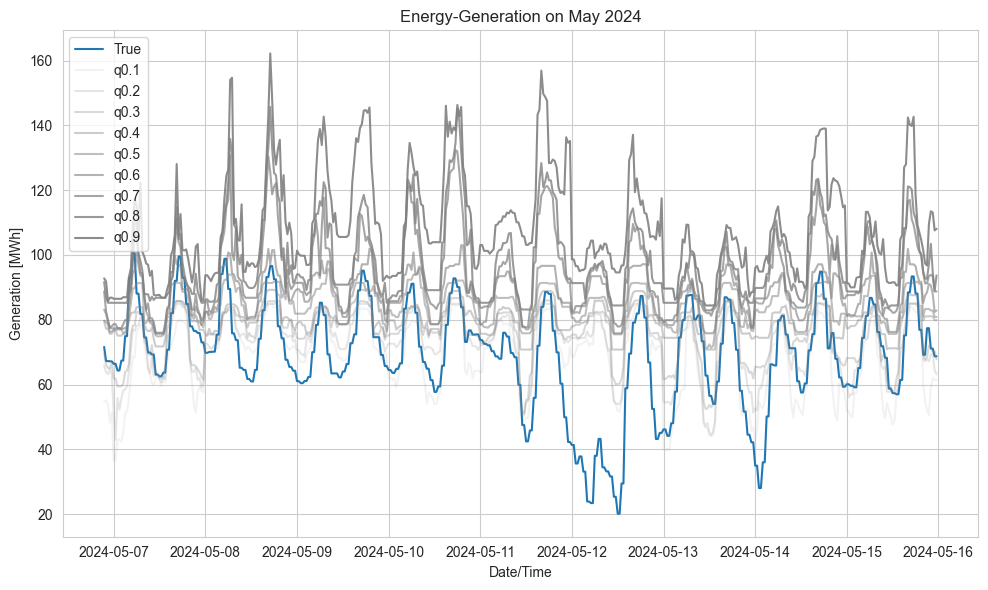

In [37]:
lgbm_model.plot_quantils(fe.y_test.index, lgbm_model.q_predictions, quantiles, month=5, year = 2024)

In [27]:
import model_utils

quantiles = np.arange(0.1, 1.0, 0.1)
quantiles = np.round(quantiles, 1)

# Specify model save directory
model_save_dir_qr = "lgbm_model_demand_SS_Price"

fe.y_train = backup["train"]["SS_Price"]
fe.y_val = backup["val"]["SS_Price"]
fe.y_test = backup["test"]["SS_Price"]

lgbm_model2 = model_utils.LGBMRegressorModel(fe, quantiles, model_save_dir=model_save_dir_qr, load_pretrained=False)
lgbm_model2.train_and_predict()  # This will skip training for already loaded models
print(f"Quantile Regressor Pinball Score: {lgbm_model2.pinball_score()}")

[LightGBM] [Info] Total Bins 1617
[LightGBM] [Info] Number of data points in the train set: 3276, number of used features: 16
[LightGBM] [Info] Start training from score 30.000000
Training until validation scores don't improve for 50 rounds
[50]	train's quantile: 4.42317	valid's quantile: 4.43274
[100]	train's quantile: 3.88668	valid's quantile: 4.54581
Early stopping, best iteration is:
[54]	train's quantile: 4.36838	valid's quantile: 4.42394
Saved Quantile Regressor model for quantile 0.1 to lgbm_model_demand_SS_Price\lgbm_model_quantile_0.1.pkl
[LightGBM] [Info] Total Bins 1617
[LightGBM] [Info] Number of data points in the train set: 3276, number of used features: 16
[LightGBM] [Info] Start training from score 49.930000
Training until validation scores don't improve for 50 rounds
[50]	train's quantile: 7.13636	valid's quantile: 8.05459
Early stopping, best iteration is:
[4]	train's quantile: 11.1311	valid's quantile: 7.71317
Saved Quantile Regressor model for quantile 0.2 to lgbm_m

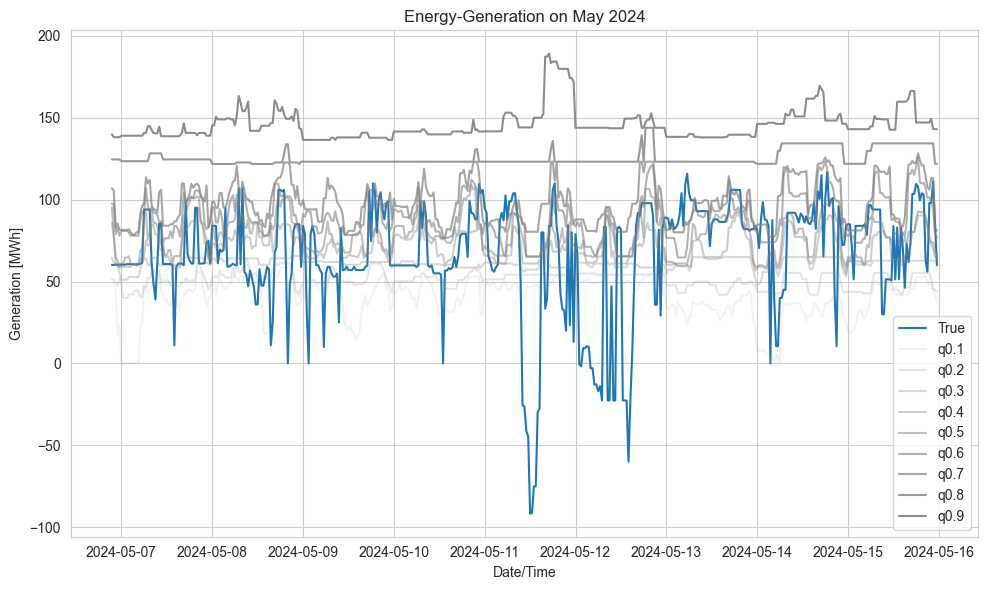

In [38]:
lgbm_model.plot_quantils(fe.y_test.index, lgbm_model2.q_predictions, quantiles, month=5, year = 2024)

In [39]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV
lr = LinearRegression()
rfr = RandomForestRegressor(n_estimators = 50, max_depth = 10, min_samples_split = 50, min_samples_leaf = 20)
gs_rfr = RandomizedSearchCV(rfr, param_distributions = {"n_estimators": [10, 20, 50, 100, 200, 500], "max_depth": [2,5,7,10, 12], "min_samples_split": [5, 10, 20, 30, 50], "min_samples_leaf": [5, 10, 20, 50, 100, 200]}, n_iter = 5, cv = 2)
fe.y_train = backup["train"]
fe.y_val = backup["val"]
fe.y_train = backup["train"]
fe.y_val = backup["val"]
lr.fit(fe.X_train, fe.y_train)
gs_rfr.fit(fe.X_train, fe.y_train)

RandomizedSearchCV(cv=2,
                   estimator=RandomForestRegressor(max_depth=10,
                                                   min_samples_leaf=20,
                                                   min_samples_split=50,
                                                   n_estimators=50),
                   n_iter=5,
                   param_distributions={'max_depth': [2, 5, 7, 10, 12],
                                        'min_samples_leaf': [5, 10, 20, 50, 100,
                                                             200],
                                        'min_samples_split': [5, 10, 20, 30,
                                                              50],
                                        'n_estimators': [10, 20, 50, 100, 200,
                                                         500]})

In [40]:
from sklearn.metrics import r2_score, mean_absolute_error as mae, mean_absolute_percentage_error as mape
fe.y_test = backup["test"]
pred_lr = lr.predict(fe.X_test)
pred_rfr = gs_rfr.predict(fe.X_test)
print(r2_score(fe.y_test, pred_lr))
print(r2_score(fe.y_test, pred_rfr))

-1.4384175421974552
-0.7465314348017835


In [41]:
print(mae(fe.y_test, pred_lr))
print(mae(fe.y_test, pred_rfr))

30.356167166492007
23.218342273649345


In [42]:
print(mape(fe.y_test, pred_lr))
print(mape(fe.y_test, pred_rfr))

1675784058187325.0
1748091741552362.2


In [43]:
import plotly.express as px

px.line(x = fe.y_test.index, y = [fe.y_test["DA_Price"], pred_lr[:, 0], pred_rfr[:, 0]], labels = ["True", "LR", "RFR"], title = "Predicted DA prices vs. actual values (blue)")

In [44]:
import plotly.express as px

px.line(x = fe.y_test.index, y = [fe.y_test["SS_Price"], pred_lr[:, 1], pred_rfr[:, 1]], labels = ["True", "LR", "RFR"], title = "Predicted SS prices vs. actual values (blue)")